# Explore encoded vectors

In [1]:
import os 
import pandas as pd
import numpy as np
import glob
import umap
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
import cv2

/home/mathiane/miniconda3/envs/LNENBarlowTwins/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Create a table from encoded vectors

In [2]:
root_folder_to_proj = "projector_toy"
root_tumor_non_tumor =  "/home/mathiane/LNEN_files_imgs/TumorSegmentationDataSets/TumorNonTumor_Ki67_dataset"
encoded_df = pd.DataFrame() 
for tneid in os.listdir(root_folder_to_proj):
    for npy in os.listdir(os.path.join(root_folder_to_proj, tneid)):
        encoded_v = np.load(os.path.join( root_folder_to_proj, tneid, npy))
        encoded_v = np.transpose(encoded_v.flatten())
        c_df = pd.DataFrame(encoded_v) 
        c_df = c_df.T
        img_id  =  npy.split('/')[-1][:-4]
        c_df['img_id']  = img_id
        c_df['tne_id']  = img_id.split('_')[0]  
        # get label 
        jpg_name = npy[:-3]+"jpg"
        tumor_non_tumor = glob.glob(f"{root_tumor_non_tumor}/{tneid}/*/{jpg_name}")[0].split("/")[-2]
        c_df['tumor_seg_class']  = tumor_non_tumor
        encoded_df = pd.concat([encoded_df, c_df], ignore_index=True)

In [3]:
set(encoded_df["tumor_seg_class"])

{'Normal', 'Tumor', 'Tumoral'}

In [4]:
encoded_df['tumor_seg_class'] = encoded_df['tumor_seg_class'].replace(['Tumoral'], 'Tumor')

In [5]:
encoded_df.head()

,0,1,2,3,4,5,6,7,8,9,...,121,122,123,124,125,126,127,img_id,tne_id,tumor_seg_class
0,0.122059,0.860910,-0.279050,0.111003,-0.998461,-0.140345,1.074245,0.105734,0.242810,-0.561062,...,-0.029962,1.021502,-1.000994,-0.165555,1.044097,-0.271463,0.123158,TNE1887-ki67_66561_23553,TNE1887-ki67,Tumor
1,-0.391668,1.047264,-1.022923,0.110267,-0.956683,0.041697,0.668726,0.338884,-0.004290,-0.917860,...,-0.485419,0.812077,-0.692939,-0.793986,0.256910,-0.750958,0.580032,TNE1887-ki67_46081_45057,TNE1887-ki67,Tumor
2,1.177232,0.415336,0.879576,0.811524,-0.525730,-0.674045,0.590901,-0.643418,-0.562041,0.358249,...,0.727900,0.312755,-0.619340,0.828240,1.635284,1.047881,-1.489438,TNE1887-ki67_12801_16897,TNE1887-ki67,Tumor
3,0.147657,0.359314,-0.136558,0.092732,-0.214162,0.014284,0.254516,0.183494,0.071943,-0.140932,...,-0.124608,0.294588,-0.289277,-0.306755,0.435959,-0.107490,0.083245,TNE1887-ki67_64513_75777,TNE1887-ki67,Tumor
4,0.768332,0.831953,0.529511,0.761438,-1.081235,-0.767768,1.141451,-0.523484,-0.460454,-0.080188,...,0.756907,1.102457,-1.058938,0.717911,1.954953,0.617084,-1.149232,TNE1887-ki67_16897_28673,TNE1887-ki67,Tumor


In [6]:
encoded_df.shape

(1991, 131)

## UMAP low dimensional representation of encoded vectors

In [7]:
reducer = umap.UMAP(n_components=2)
encoded_vector = encoded_df.iloc[:,0:128]
scaled_encoded_vector = StandardScaler().fit_transform(encoded_vector)
embedding = reducer.fit_transform(scaled_encoded_vector)

In [8]:
embedding_df = pd.DataFrame(embedding)
embedding_df = embedding_df.assign(tumor_seg_class= encoded_df["tumor_seg_class"] )

<Axes: xlabel='0', ylabel='1'>

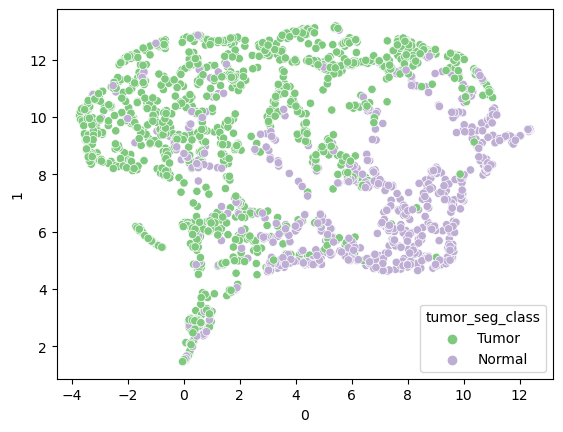

In [9]:
sns.set_palette("Accent")
sns.scatterplot(data=embedding_df, x=0, y=1, hue="tumor_seg_class")

## K-Means clustering of encoded vectors

In [93]:
# 1'5
km = KMeans(n_clusters=12, random_state=0, n_init="auto").fit(encoded_vector)
#km = DBSCAN(eps=1, min_samples=3).fit(encoded_vector)

In [94]:
labels = km.labels_

In [95]:
embedding_df= embedding_df.assign(KMeans_cluster=labels)
embedding_df['KMeans_cluster'] = embedding_df['KMeans_cluster'].astype('category')


<Axes: xlabel='0', ylabel='1'>

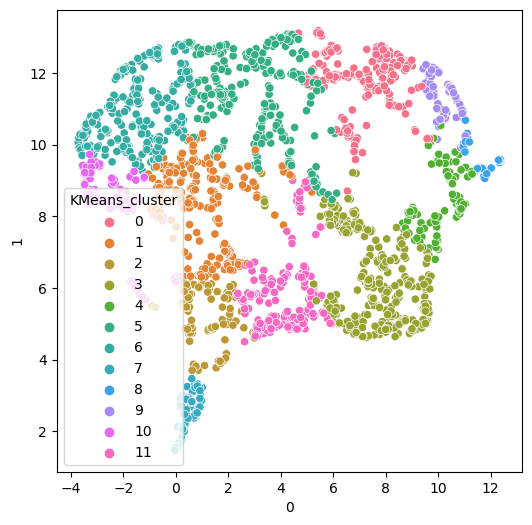

In [96]:
sns.set_palette("Accent")
sns.scatterplot(data=embedding_df, x=0, y=1, hue="KMeans_cluster")

## Explloration of the clusters

In [97]:
class_cluster = embedding_df.groupby(["KMeans_cluster", "tumor_seg_class"],observed=True).size().reset_index(name='counts')

In [98]:
class_cluster = class_cluster.assign(prop=class_cluster['counts'] / class_cluster.groupby('KMeans_cluster',observed=True)['counts'].transform('sum'))

In [99]:
class_cluster

,KMeans_cluster,tumor_seg_class,counts,prop
0,1,Normal,53,0.242009
1,1,Tumor,166,0.757991
2,11,Normal,114,0.651429
3,11,Tumor,61,0.348571
4,6,Normal,15,0.052817
5,6,Tumor,269,0.947183
6,10,Normal,3,0.026316
7,10,Tumor,111,0.973684
8,5,Normal,23,0.085185
9,5,Tumor,247,0.914815


Assign a class to a cluster in function of the majority class 

In [100]:
maj_class = []
for c in set(class_cluster["KMeans_cluster"]):
    class_cluster_c_clst = class_cluster[(class_cluster["KMeans_cluster"] == c) ]
    maj_class.append(str(class_cluster_c_clst[class_cluster_c_clst["prop"] ==  max(class_cluster_c_clst["prop"])]["tumor_seg_class"].values[0]))
    maj_class.append(str(class_cluster_c_clst[class_cluster_c_clst["prop"] ==  max(class_cluster_c_clst["prop"])]["tumor_seg_class"].values[0]))
class_cluster=class_cluster.assign(maj_class= maj_class)

<Axes: xlabel='KMeans_cluster', ylabel='counts'>

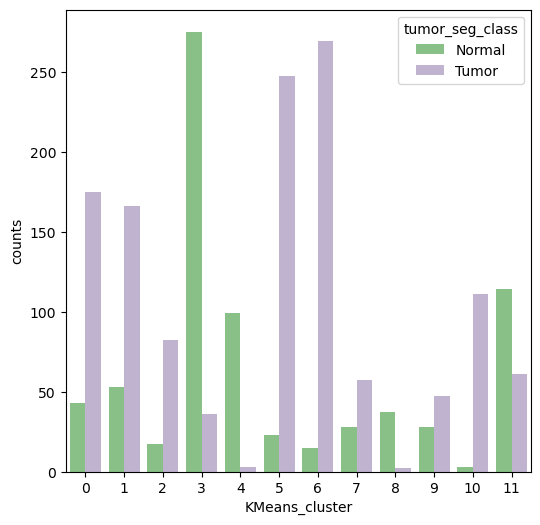

In [101]:
sns.barplot(class_cluster, x="KMeans_cluster", y="counts", hue="tumor_seg_class")

<Axes: xlabel='KMeans_cluster', ylabel='prop'>

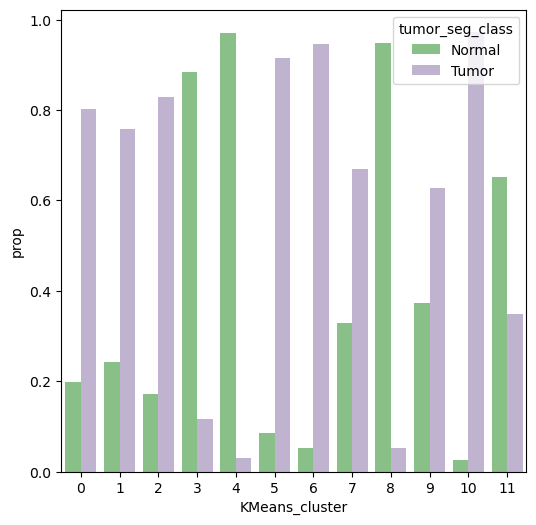

In [102]:
sns.barplot(class_cluster, x="KMeans_cluster", y="prop", hue="tumor_seg_class")

### Compute scores

1- Proportion of well classified tumor tiles

In [19]:
sum(class_cluster[(class_cluster["tumor_seg_class"]=="Tumor") & (class_cluster["maj_class"]=="Tumor")]["counts"])/ sum(class_cluster[(class_cluster["tumor_seg_class"]=="Tumor") ]["counts"])

0.5469745222929936

2- Proportion of well classified non-tumor tiles

In [20]:
sum(class_cluster[(class_cluster["tumor_seg_class"]=="Normal") & (class_cluster["maj_class"]=="Normal")]["counts"])/ sum(class_cluster[(class_cluster["tumor_seg_class"]=="Normal") ]["counts"])

0.46802721088435373

3 - Accuracy

In [21]:
tp = sum(class_cluster[(class_cluster["tumor_seg_class"]=="Tumor") & (class_cluster["maj_class"]=="Tumor")]["counts"])
tn = sum(class_cluster[(class_cluster["tumor_seg_class"]=="Normal") & (class_cluster["maj_class"]=="Normal")]["counts"])
fp = sum(class_cluster[(class_cluster["tumor_seg_class"]=="Normal") ]["counts"]) - tn
fn = sum(class_cluster[(class_cluster["tumor_seg_class"]=="Tumor") ]["counts"]) - tp
acc = (tp+tn)/(tp+tn+fp+fn)
acc

0.5178302360622803

#### Accuracy by number of clusters

In [22]:
for i in range(2,30):
    km = KMeans(n_clusters=i, random_state=0, n_init="auto").fit(encoded_vector)
    labels = km.labels_
    embedding_df= embedding_df.assign(KMeans_cluster=labels)
    embedding_df['KMeans_cluster'] = embedding_df['KMeans_cluster'].astype('category')
    class_cluster = embedding_df.groupby(["KMeans_cluster", "tumor_seg_class"]).size().reset_index(name='counts')
    class_cluster = class_cluster.assign(prop=class_cluster['counts'] / class_cluster.groupby('KMeans_cluster')['counts'].transform('sum'))
    maj_class = []
    for c in set(class_cluster["KMeans_cluster"]):
        class_cluster_c_clst = class_cluster[(class_cluster["KMeans_cluster"] == c) ]
        maj_class.append(str(class_cluster_c_clst[class_cluster_c_clst["prop"] ==  max(class_cluster_c_clst["prop"])]["tumor_seg_class"].values[0]))
        maj_class.append(str(class_cluster_c_clst[class_cluster_c_clst["prop"] ==  max(class_cluster_c_clst["prop"])]["tumor_seg_class"].values[0]))
    class_cluster=class_cluster.assign(maj_class= maj_class)
    tp = sum(class_cluster[(class_cluster["tumor_seg_class"]=="Tumor") & (class_cluster["maj_class"]=="Tumor")]["counts"])
    tn = sum(class_cluster[(class_cluster["tumor_seg_class"]=="Normal") & (class_cluster["maj_class"]=="Normal")]["counts"])
    fp = sum(class_cluster[(class_cluster["tumor_seg_class"]=="Normal") ]["counts"]) - tn
    fn = sum(class_cluster[(class_cluster["tumor_seg_class"]=="Tumor") ]["counts"]) - tp
    acc = (tp+tn)/(tp+tn+fp+fn)
    print(i,acc)

2 0.6870919136112507
3 0.7071823204419889
4 0.8046207935710699
5 0.8367654445002511
6 0.8317428427925665
7 0.8307383224510296
8 0.8292315419387243
9 0.8327473631341035
10 0.8277247614264189
11 0.8352586639879458
12 0.843294826720241
13 0.8427925665494727
14 0.8357609241587142
15 0.8357609241587142
16 0.838774485183325
17 0.8483174284279257
18 0.844299347061778
19 0.8463083877448518
20 0.844299347061778
21 0.8412857860371673
22 0.8427925665494727
23 0.8437970868910095
24 0.8448016072325465
25 0.8473129080863887
26 0.8518332496233049
27 0.8608739326971371
28 0.8528377699648418
29 0.8588648920140632


## Exploration of some clusters
### Clusters representative of tumoral tiles 

In [103]:
def plot_tiles(paths):
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10,10))  
    j = 0 
    i = 0
    c = 0
    for p in paths:
        im = cv2.imread(p)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        axes[i,j].imshow(im) 
        axes[i,j].axis('off')
        if i < 3 :
            i +=1
            
        else:
            i = 0 
            j += 1
        fig.tight_layout()

In [104]:
embedding_df["img_id"] = encoded_df["img_id"]
embedding_df["tne_id"] = encoded_df["tne_id"]
embedding_df["tne_id"] = encoded_df["tne_id"]

In [105]:
path_list = []
for i in range(16):
    c_emb_df = embedding_df[embedding_df["KMeans_cluster"] == 5]
    c_emb_df = c_emb_df.sample(frac = 1).reset_index(drop=True)
    tneid = c_emb_df["tne_id"][i][:-4]
    jpg_name = c_emb_df["img_id"][i] + ".jpg"
    tumor_non_tumor = glob.glob(f"{root_tumor_non_tumor}/*/*/{jpg_name}")[0]
    path_list.append(tumor_non_tumor)

In [106]:
path_list

['/home/mathiane/LNEN_files_imgs/TumorSegmentationDataSets/TumorNonTumor_Ki67_dataset/TNE1855/Tumoral/TNE1885-ki67_37377_67585.jpg',
 '/home/mathiane/LNEN_files_imgs/TumorSegmentationDataSets/TumorNonTumor_Ki67_dataset/TNE1742/Tumoral/TNE1742-ki67_12801_17409.jpg',
 '/home/mathiane/LNEN_files_imgs/TumorSegmentationDataSets/TumorNonTumor_Ki67_dataset/TNE1503/Tumor/TNE1503.svs_28673_69633.jpg',
 '/home/mathiane/LNEN_files_imgs/TumorSegmentationDataSets/TumorNonTumor_Ki67_dataset/TNE2098/Tumor/TNE2098.svs_57345_29185.jpg',
 '/home/mathiane/LNEN_files_imgs/TumorSegmentationDataSets/TumorNonTumor_Ki67_dataset/TNE1867/Tumoral/TNE1867.svs_9729_29185.jpg',
 '/home/mathiane/LNEN_files_imgs/TumorSegmentationDataSets/TumorNonTumor_Ki67_dataset/TNE1576/Tumoral/TNE1576.svs_95233_39425.jpg',
 '/home/mathiane/LNEN_files_imgs/TumorSegmentationDataSets/TumorNonTumor_Ki67_dataset/TNE1925/Tumoral/TNE1925.svs_10753_43009.jpg',
 '/home/mathiane/LNEN_files_imgs/TumorSegmentationDataSets/TumorNonTumor_Ki67_d

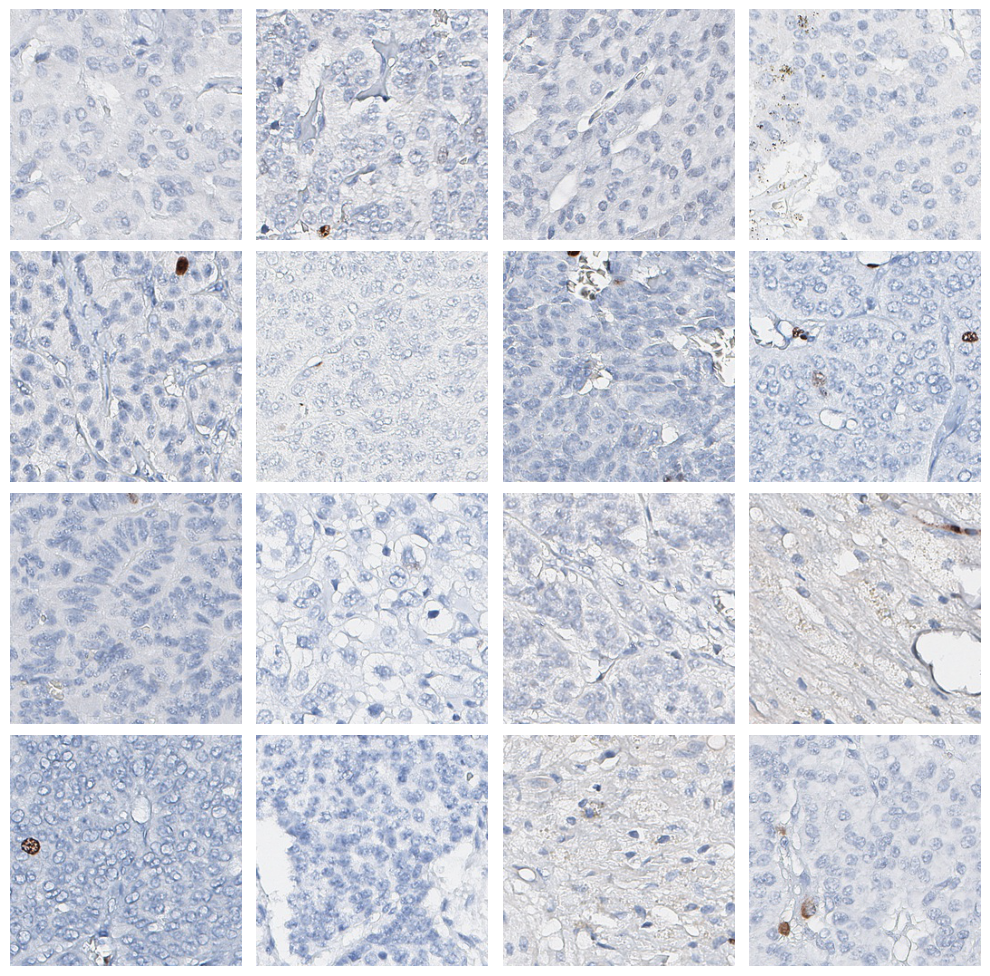

In [107]:

plot_tiles(path_list)


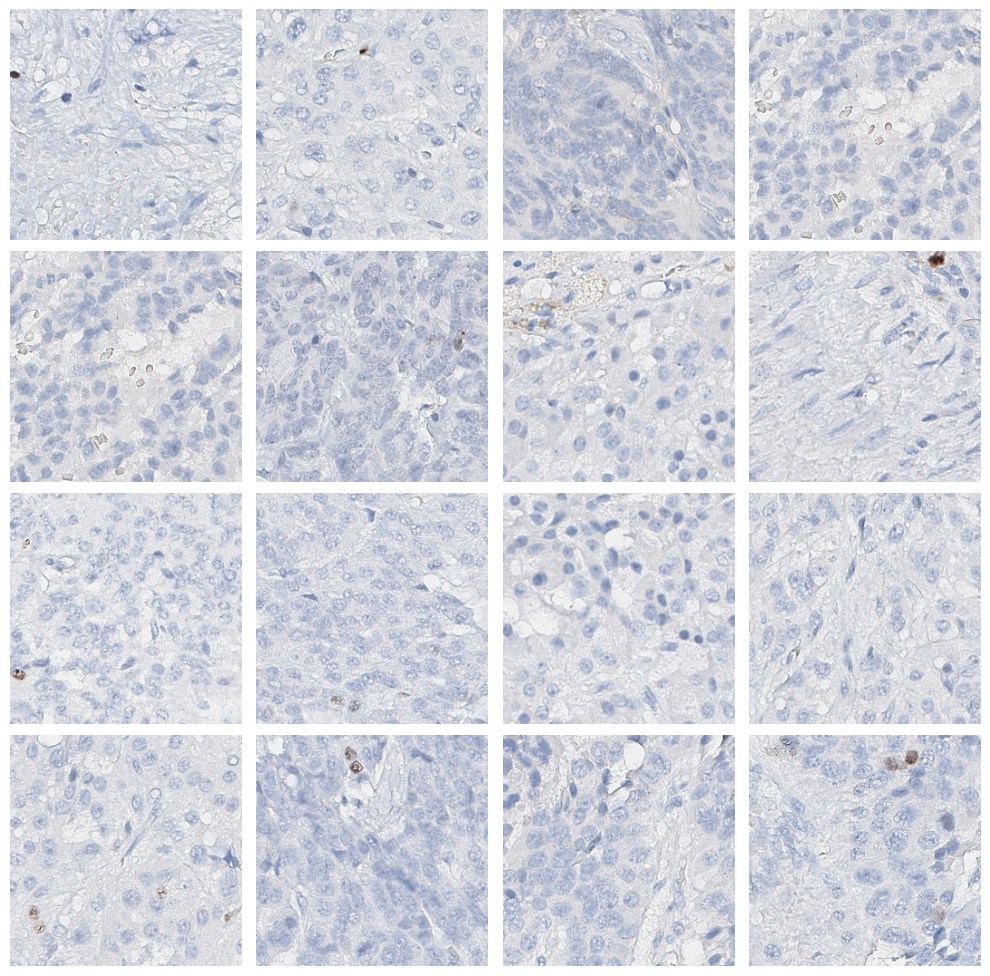

In [108]:
path_list = []
for i in range(16):
    c_emb_df = embedding_df[embedding_df["KMeans_cluster"] == 6]
    c_emb_df = c_emb_df.sample(frac = 1).reset_index(drop=True)
    tneid = c_emb_df["tne_id"][i][:-4]
    jpg_name = c_emb_df["img_id"][i] + ".jpg"
    tumor_non_tumor = glob.glob(f"{root_tumor_non_tumor}/*/*/{jpg_name}")[0]
    path_list.append(tumor_non_tumor)

plot_tiles(path_list)

### Clusters representative of non-tumoral tiles 

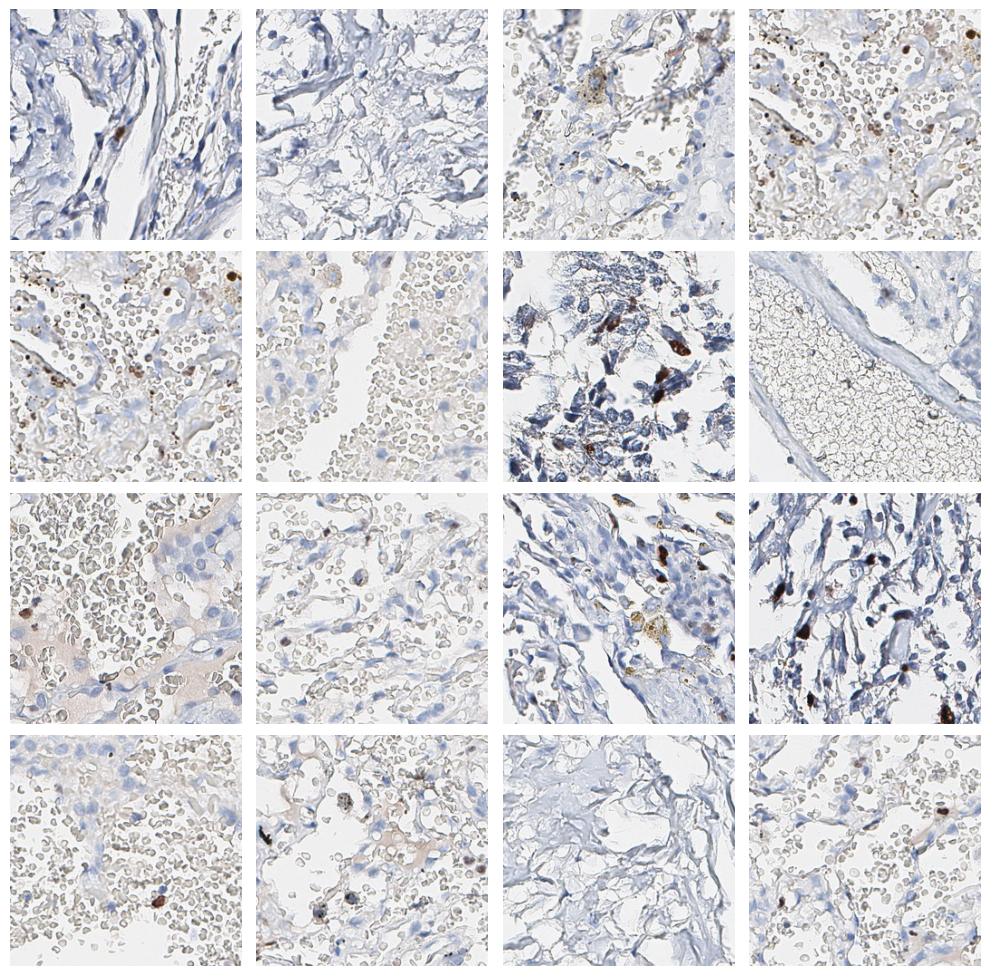

In [110]:
path_list = []
for i in range(16):
    c_emb_df = embedding_df[embedding_df["KMeans_cluster"] == 4]
    c_emb_df = c_emb_df.sample(frac = 1).reset_index(drop=True)
    tneid = c_emb_df["tne_id"][i][:-4]
    jpg_name = c_emb_df["img_id"][i] + ".jpg"
    tumor_non_tumor = glob.glob(f"{root_tumor_non_tumor}/*/*/{jpg_name}")[0]
    path_list.append(tumor_non_tumor)

plot_tiles(path_list)

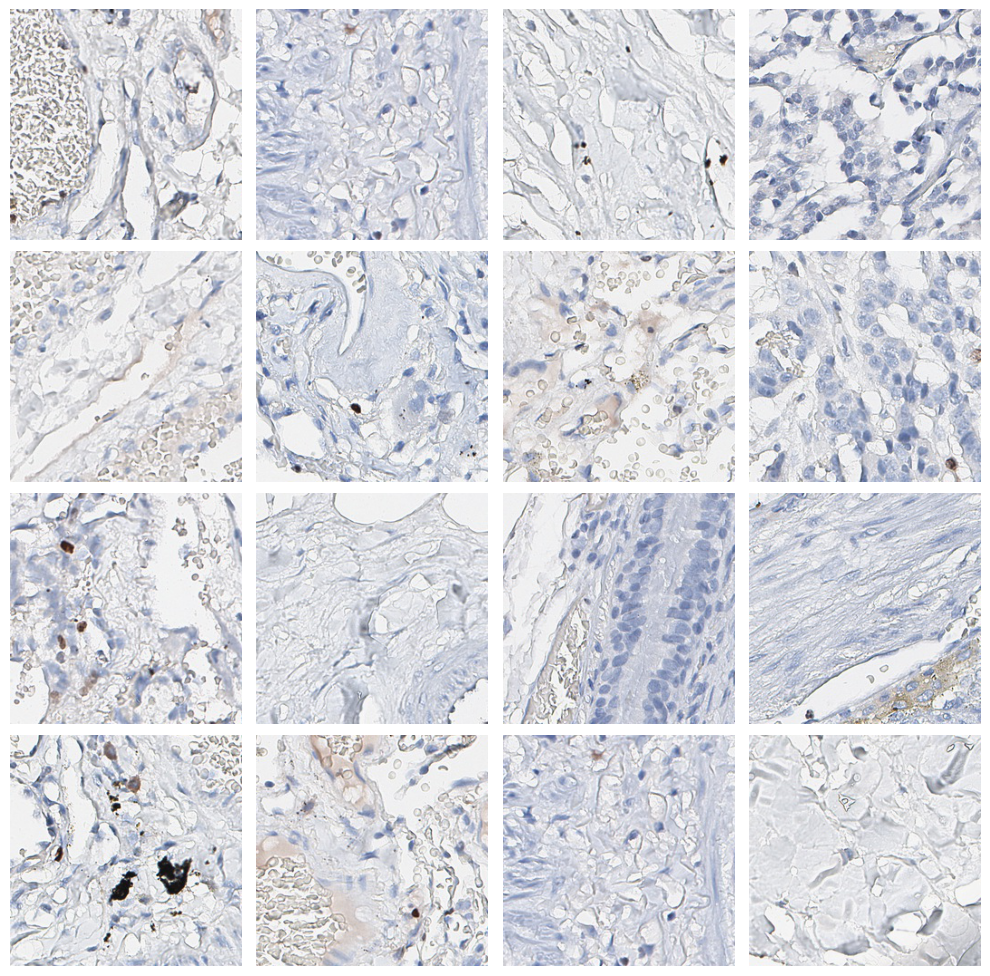

In [111]:
path_list = []
for i in range(16):
    c_emb_df = embedding_df[embedding_df["KMeans_cluster"] == 3]
    c_emb_df = c_emb_df.sample(frac = 1).reset_index(drop=True)
    tneid = c_emb_df["tne_id"][i][:-4]
    jpg_name = c_emb_df["img_id"][i] + ".jpg"
    tumor_non_tumor = glob.glob(f"{root_tumor_non_tumor}/*/*/{jpg_name}")[0]
    path_list.append(tumor_non_tumor)

plot_tiles(path_list)

### Clusters non representative 

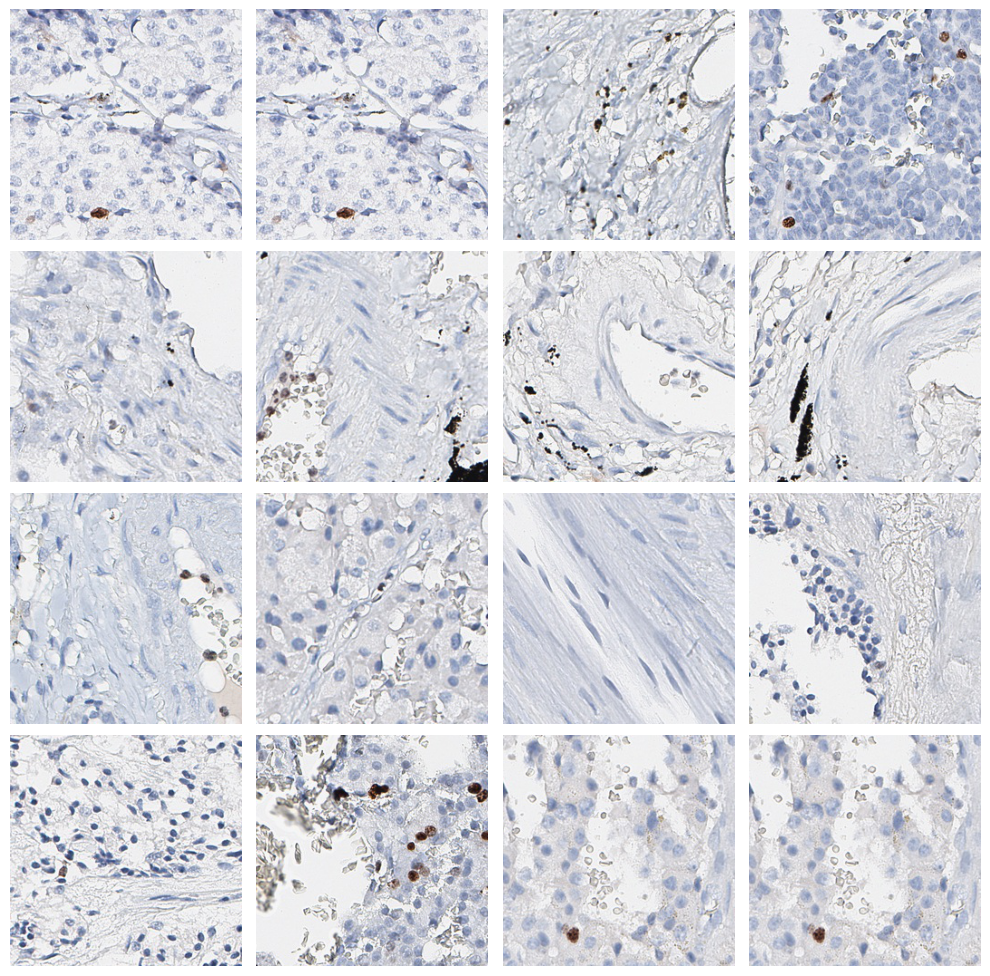

In [112]:
path_list = []
for i in range(16):
    c_emb_df = embedding_df[embedding_df["KMeans_cluster"] == 11]
    c_emb_df = c_emb_df.sample(frac = 1).reset_index(drop=True)
    tneid = c_emb_df["tne_id"][i][:-4]
    jpg_name = c_emb_df["img_id"][i] + ".jpg"
    tumor_non_tumor = glob.glob(f"{root_tumor_non_tumor}/*/*/{jpg_name}")[0]
    path_list.append(tumor_non_tumor)

plot_tiles(path_list)